# Data Plots

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle
from pathlib import Path
import seaborn as sns
from tqdm.notebook import trange, tqdm
import wandb

from keras.layers import Dense, LSTM, Input
from keras.models import Sequential, load_model, Model
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping, Callback, LearningRateScheduler
from keras.optimizers import Adam, RMSprop

from waylon_keras_utils import train_model
from waylon_layer_utils import AttentionLSTM

from waylon_layer_utils import AttentionLSTM

from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from utils import load_scale_reshape_X_y_ATTENTION, plot_preds_vs_actuals

sns.set()

DATA_DIR = Path('../data')
MODELS_DIR = Path('../models')

df = pd.read_csv(DATA_DIR / 'four_class_dataset.csv', index_col=0)
# X = df.iloc[:, :-1].values.reshape(-1, 1002, 1)
X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

le = LabelEncoder()
y = le.fit_transform(y)

In [2]:
def plot_label(df, label):
    for index, data in df.iterrows():
        l = data[-1]
        if l == label:
            plt.plot(data[:-1].values)
            plt.title(f'Index {index} - Label {l}')
            plt.show()

# Individual Per Sample Plots

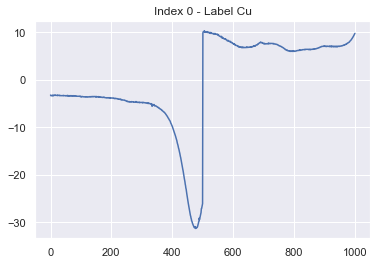

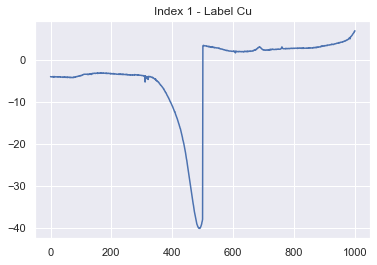

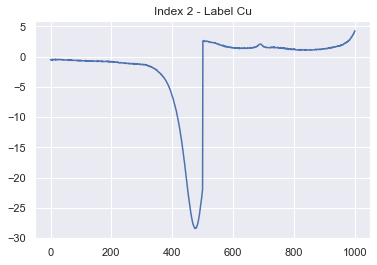

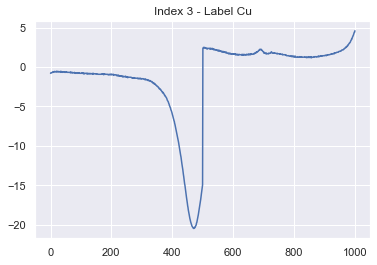

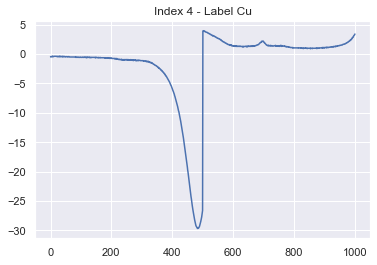

...

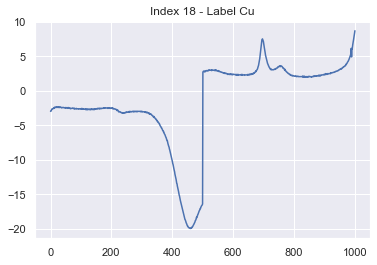

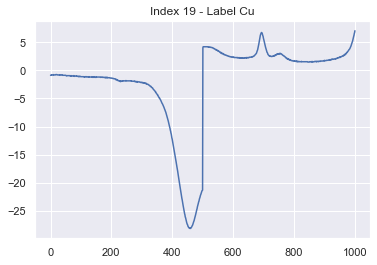

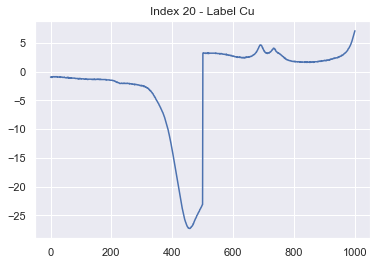

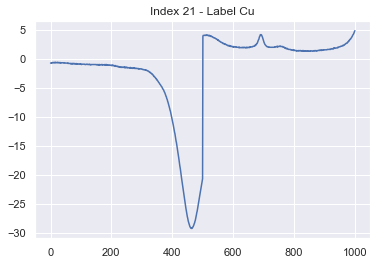

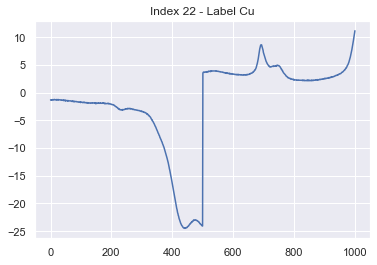

In [28]:
plot_label(df, 'Cu')

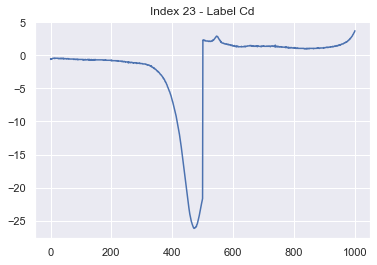

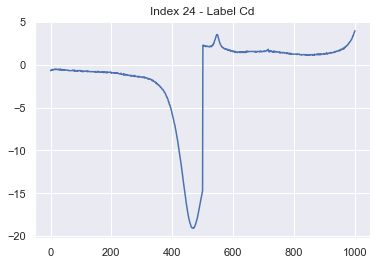

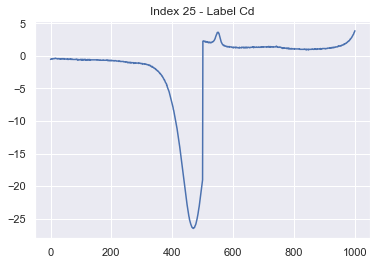

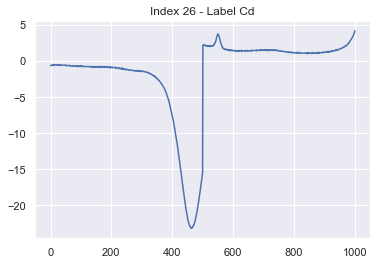

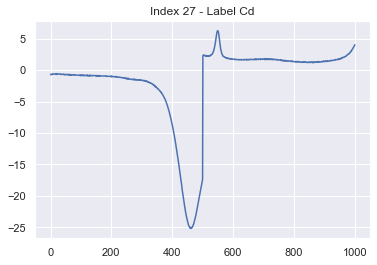

...

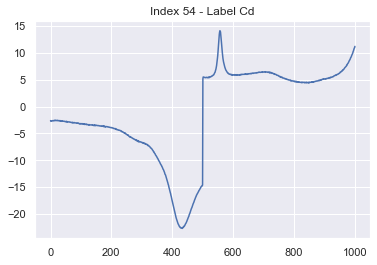

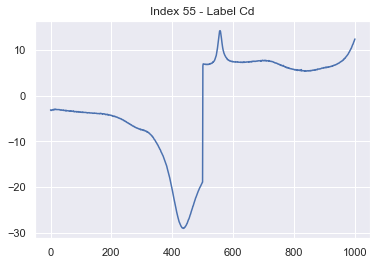

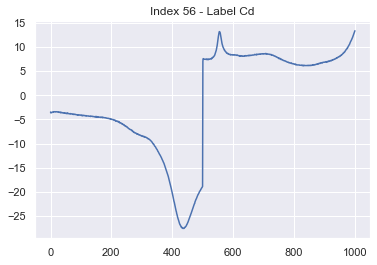

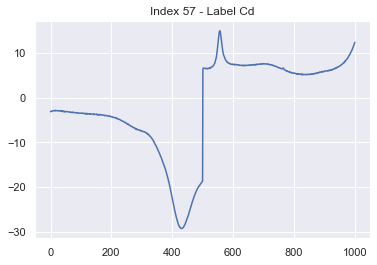

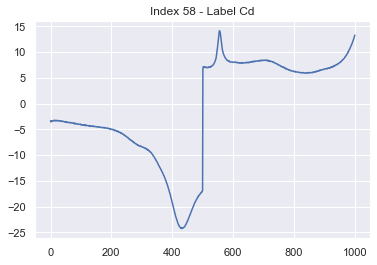

In [29]:
plot_label(df, 'Cd')

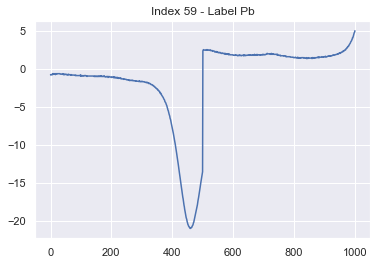

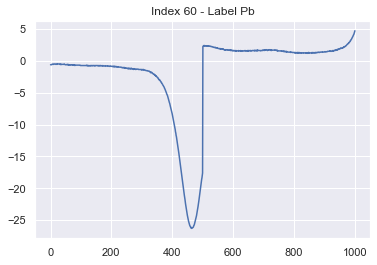

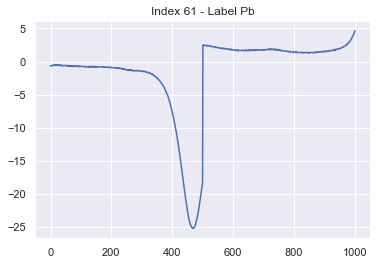

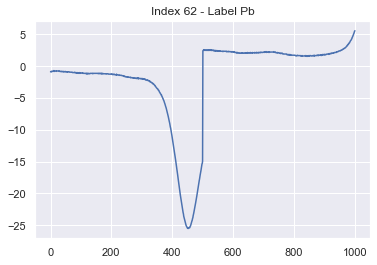

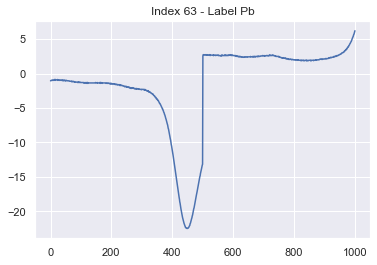

...

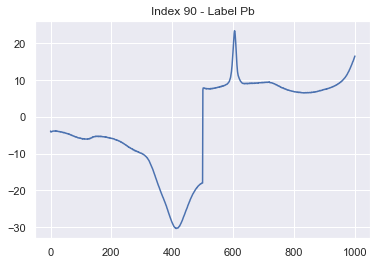

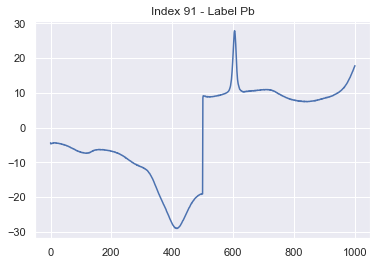

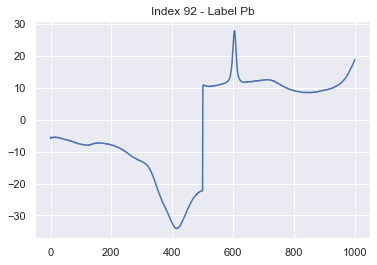

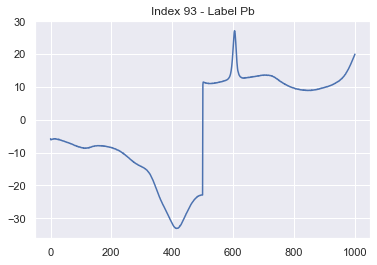

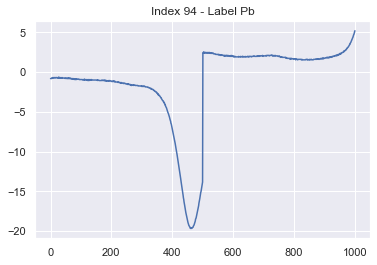

In [30]:
plot_label(df, 'Pb')

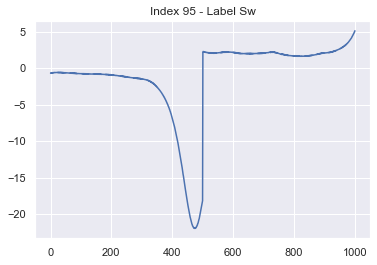

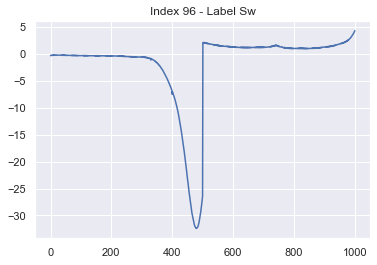

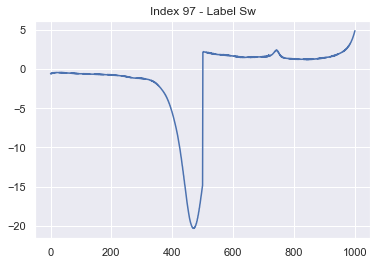

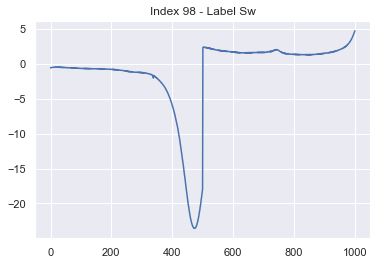

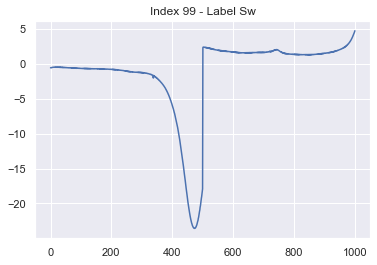

...

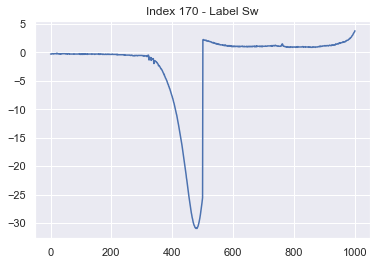

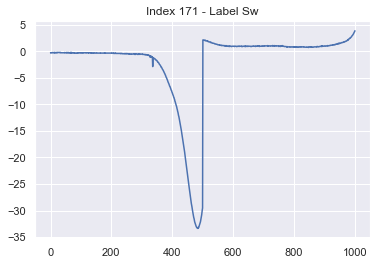

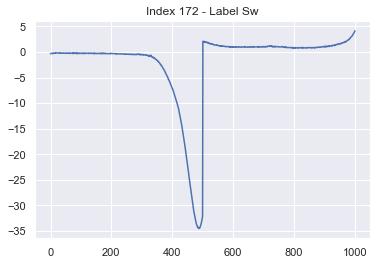

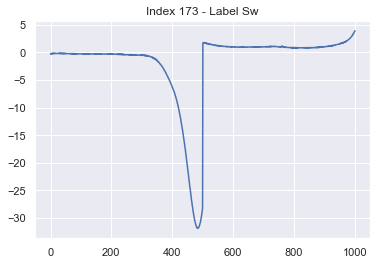

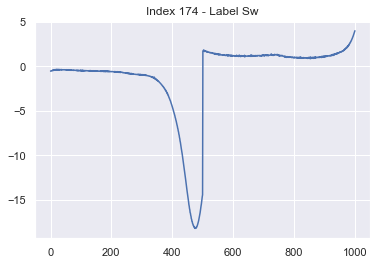

In [31]:
plot_label(df, 'Sw')

In [37]:
maxes = []
mins = []
for index, data in df.iloc[:, :-1].iterrows():
    l = data[-1]
    maxes.append(max(data))
    mins.append(min(data))

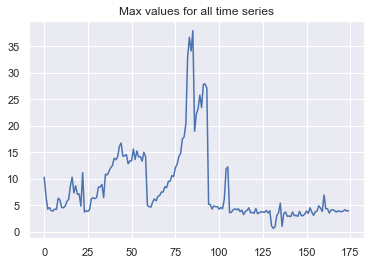

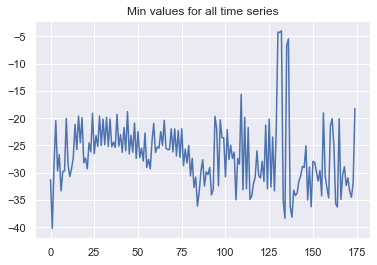

In [39]:
plt.plot(maxes)
plt.title('Max values for all time series')
plt.show()

plt.plot(mins)
plt.title('Min values for all time series')
plt.show()

In [40]:
print(f'The max value across all seqs is: {max(maxes)}')
print(f'The min value across all seqs is: {min(mins)}')

The max value across all seqs is: 37.966951
The min value across all seqs is: -40.200301


# Plotting the 91% Val Accuracy Fold

In [41]:
# Remove white lines from heatmaps
plt.rcParams["axes.grid"] = False

In [9]:
X, y = load_scale_reshape_X_y_ATTENTION(a=0, b=1, input_shape=(1, 1002))

n_splits = 5
shuffle = True
seed = 7

kfold = KFold(n_splits=n_splits, shuffle=shuffle, random_state=seed)

fold_number = 1
for train_idx, val_idx in kfold.split(X, y):
    if fold_number > 1:
        break
    # Get folds using indices
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y[train_idx], y[val_idx]

    # Transform into Keras shape
    X_train = X_train.reshape(-1, 1, 1002)
    X_val = X_val.reshape(-1, 1, 1002)
    y_train = to_categorical(y_train, num_classes=4)
    y_val = to_categorical(y_val, num_classes=4)
    fold_number += 1

In [10]:
model = load_model(MODELS_DIR / '206_model_91_acc.h5', custom_objects={'AttentionLSTM': AttentionLSTM})

In [11]:
# 91% accuracy on validation data
model.evaluate(X_val, y_val)

35/35 [==============================] - 0s 6ms/step


[0.4706158778497151, 0.9142857193946838]

In [12]:
# Awful performance on X_train
model.evaluate(X_train, y_train)

140/140 [==============================] - 0s 183us/step


[0.8727465301752091, 0.6428571343421936]

In [13]:
def make_predictions(model, data):
    pred_proba = model.predict(data)
    pred_int = [np.argmax(p) for p in pred_proba]
    # preds = to_categorical(pred_int, num_classes=4)
    return np.array(pred_int)

## Plots of 91% fold - X_Val

NUM CORRECT: 32/35
NUM INCORRECT: 3/35
ACCURACY: 0.9142857142857143


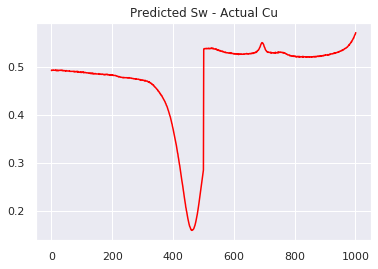

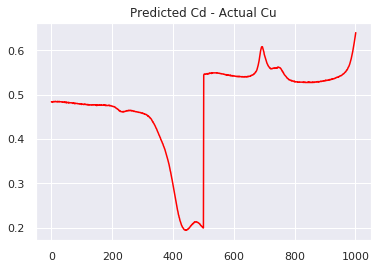

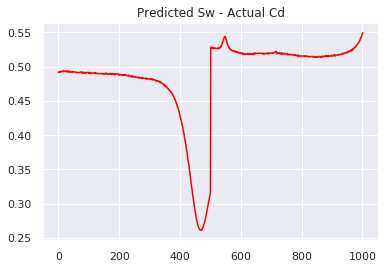

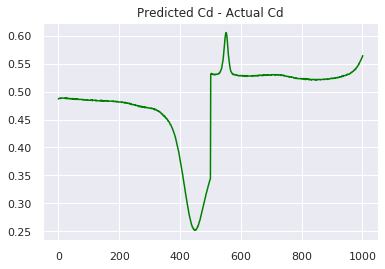

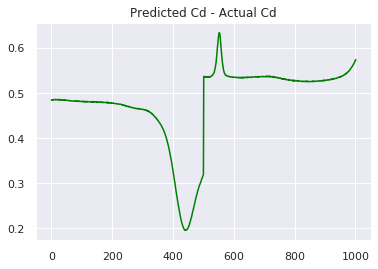

...

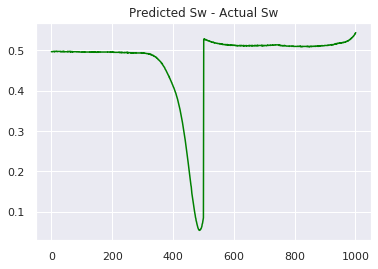

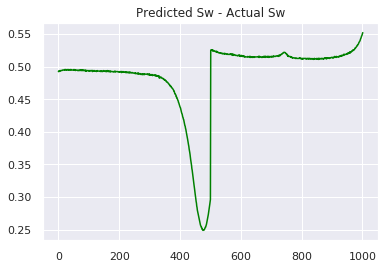

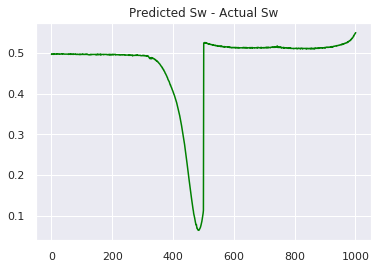

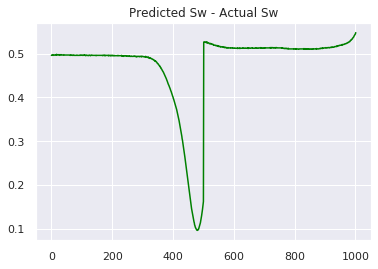

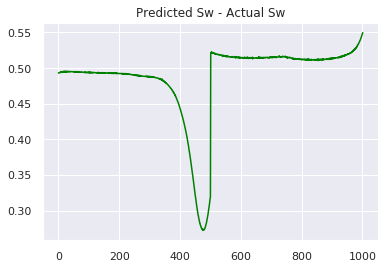

In [14]:
plot_preds_vs_actuals(model, X_val, y_val, plot_kind='all')

In [18]:
from utils import CLASS_INT_TO_NAME

In [21]:
y_val_int = [np.argmax(y) for y in y_val]
y_val_str = [CLASS_INT_TO_NAME[number] for number in y_val_int]
s = pd.Series(y_val_str)
s.value_counts()

Sw    23
Pb     5
Cd     5
Cu     2
dtype: int64

In [22]:
s.value_counts(normalize=True)

Sw    0.657143
Pb    0.142857
Cd    0.142857
Cu    0.057143
dtype: float64

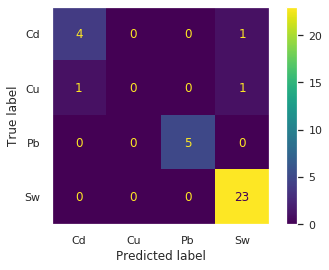

In [36]:
y_val_preds = model.predict(X_val)
y_val_preds_int = np.array([np.argmax(y) for y in y_val_preds])
cm_val = confusion_matrix(y_val_int, y_val_preds_int)
cmd_val = ConfusionMatrixDisplay(cm_val, display_labels=CLASS_INT_TO_NAME.values())
cmd_val.plot()

## Plots of 91% fold - X_train

NUM CORRECT: 90/140
NUM INCORRECT: 50/140
ACCURACY: 0.6428571428571429


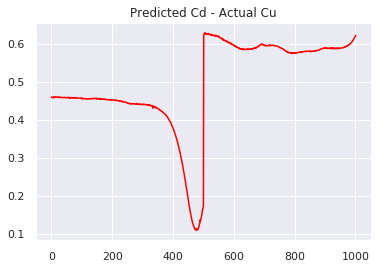

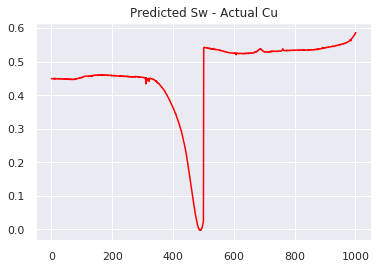

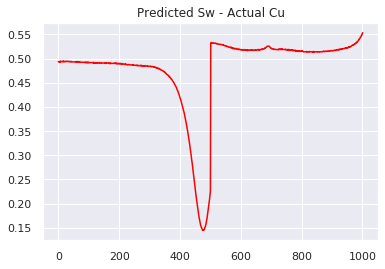

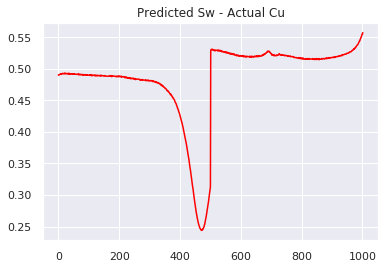

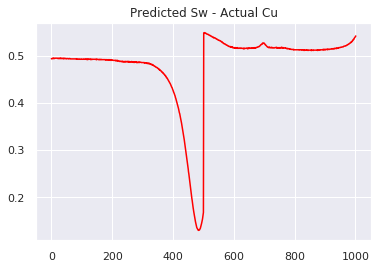

...

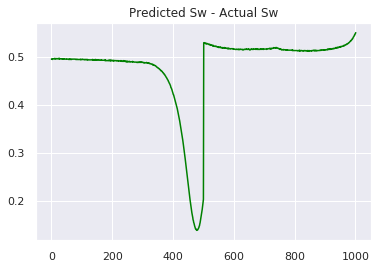

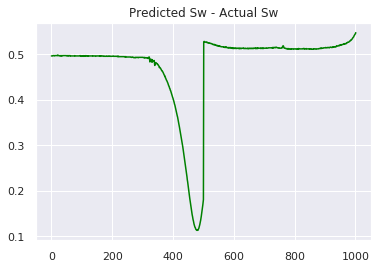

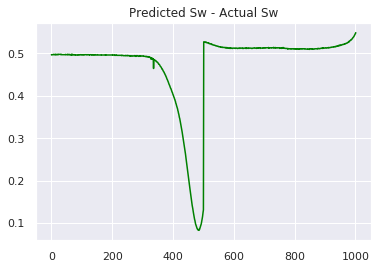

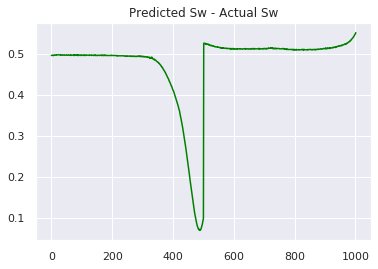

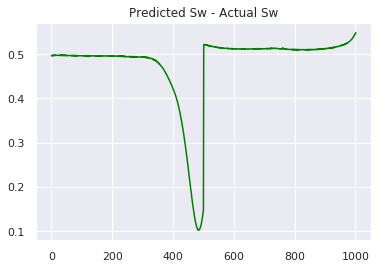

In [23]:
plot_preds_vs_actuals(model, X_train, y_train, plot_kind='all')

In [26]:
y_train_int = [np.argmax(y) for y in y_train]
y_train_str = [CLASS_INT_TO_NAME[number] for number in y_train_int]
s_train = pd.Series(y_train_str)
s_train.value_counts()

Sw    57
Pb    31
Cd    31
Cu    21
dtype: int64

In [27]:
s_train.value_counts(normalize=True)

Sw    0.407143
Pb    0.221429
Cd    0.221429
Cu    0.150000
dtype: float64

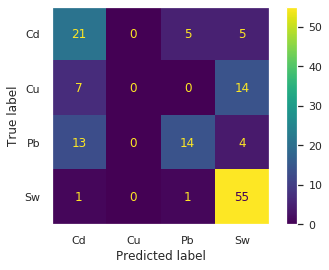

In [34]:
y_train_preds = model.predict(X_train)
y_train_preds_int = np.array([np.argmax(y) for y in y_train_preds])
cm_train = confusion_matrix(y_train_int, y_train_preds_int)
cmd_train = ConfusionMatrixDisplay(cm_train, display_labels=CLASS_INT_TO_NAME.values())
cmd_train.plot()

# Plots with Concentration

In [42]:
# Add white lines again (they were turned off for the heatmaps)
plt.rcParams["axes.grid"] = True

In [2]:
cadmium = pd.read_csv(DATA_DIR / 'cadmium.csv', index_col=0)
copper = pd.read_csv(DATA_DIR / 'copper.csv', index_col=0)
lead = pd.read_csv(DATA_DIR / 'lead.csv', index_col=0)
seawater = pd.read_csv(DATA_DIR / 'seawater.csv', index_col=0)

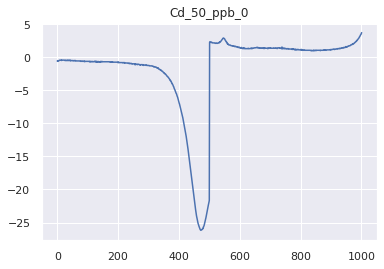

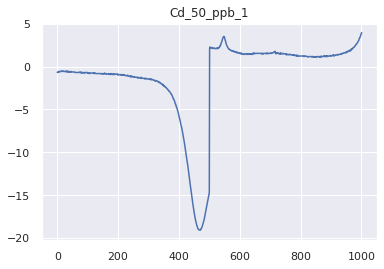

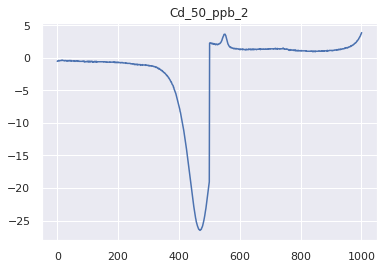

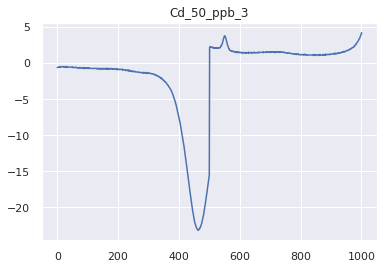

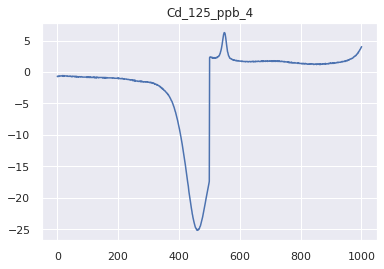

...

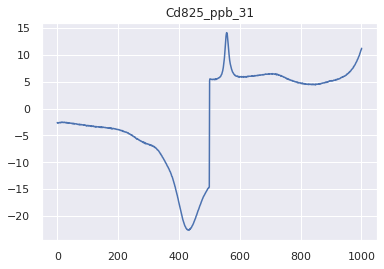

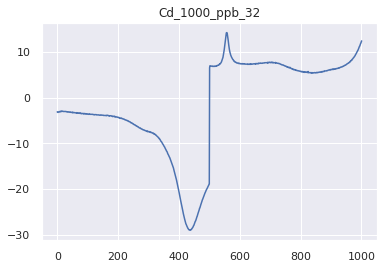

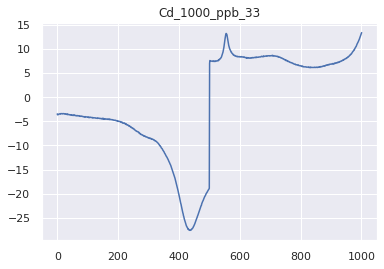

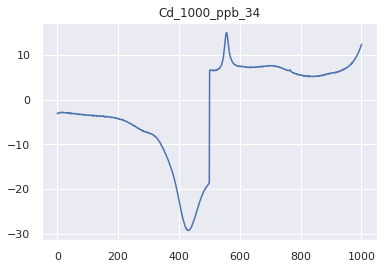

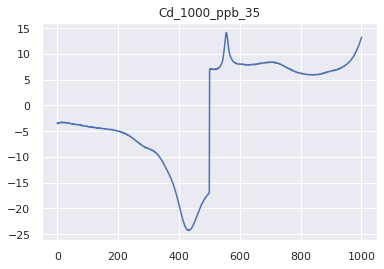

In [45]:
for col in cadmium.columns[1:]:
    plt.plot(cadmium[col])
    plt.title(col)
    plt.show()

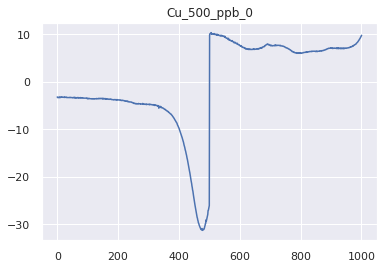

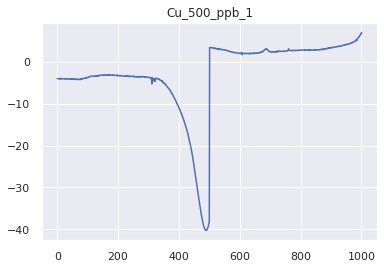

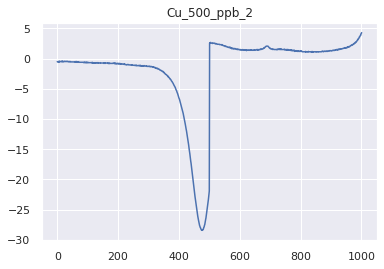

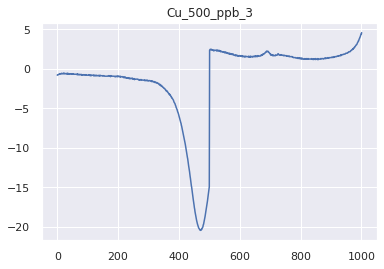

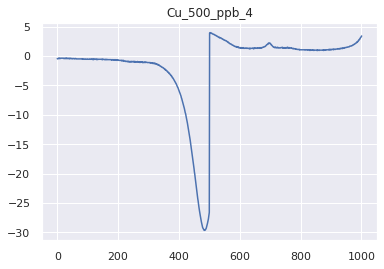

...

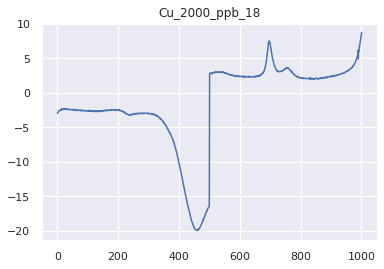

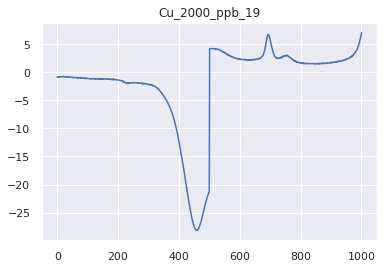

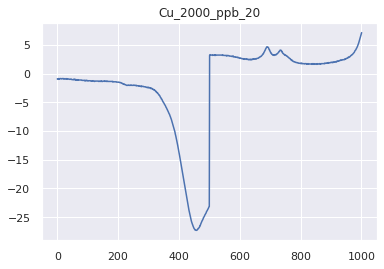

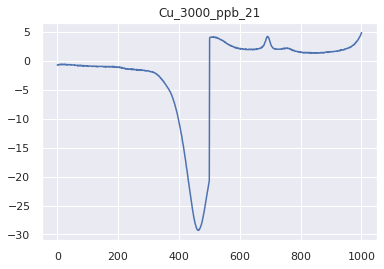

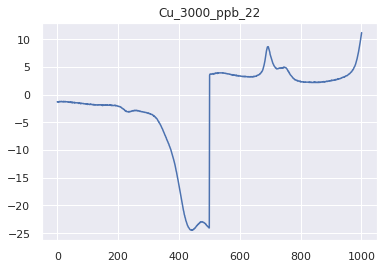

In [48]:
for col in copper.columns[1:]:
    plt.plot(copper[col])
    plt.title(col)
    plt.show()

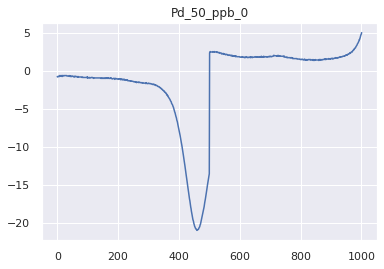

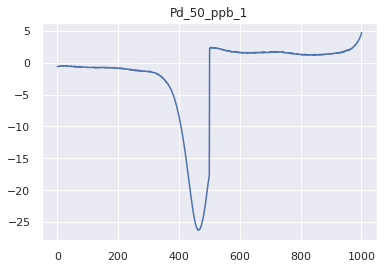

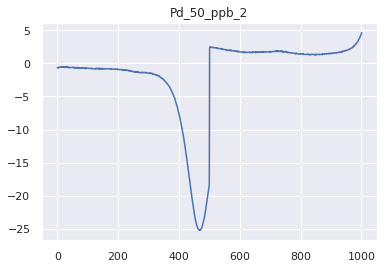

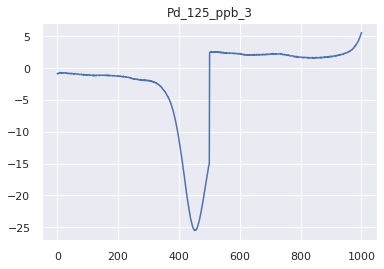

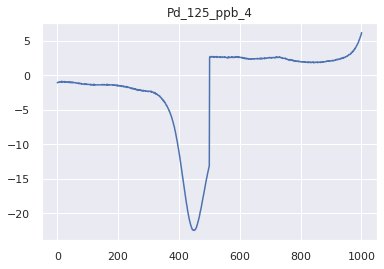

...

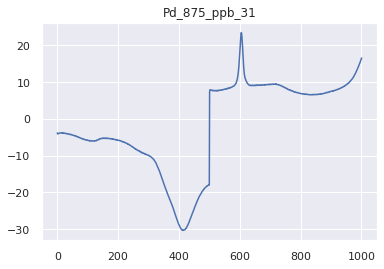

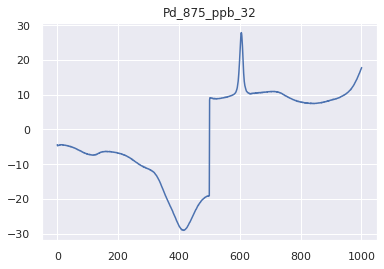

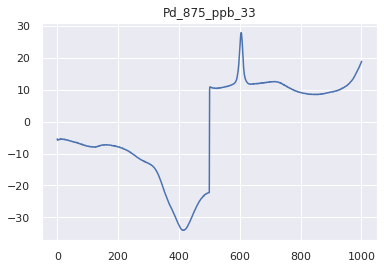

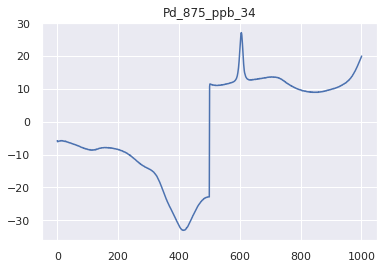

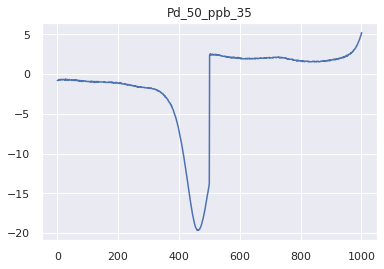

In [50]:
for col in lead.columns[1:]:
    plt.plot(lead[col])
    plt.title(col)
    plt.show()

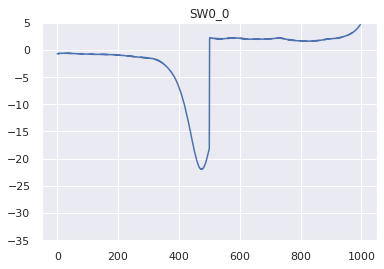

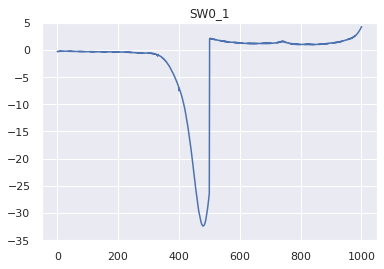

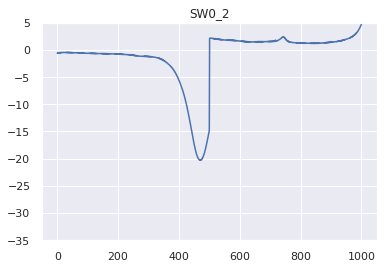

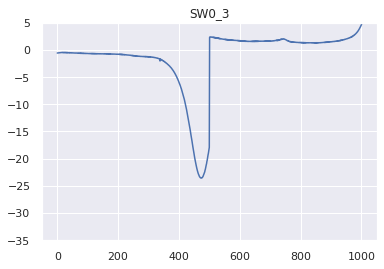

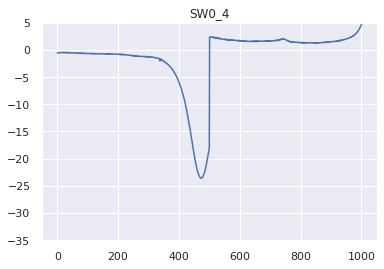

...

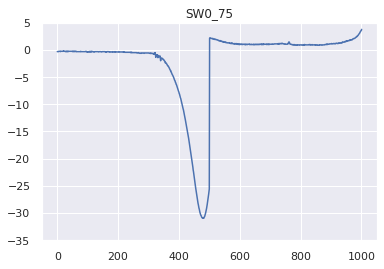

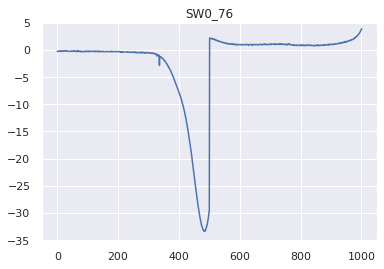

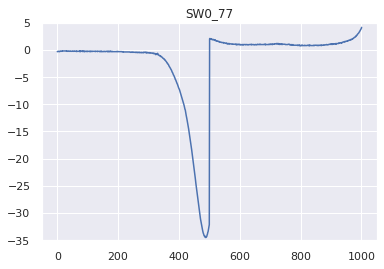

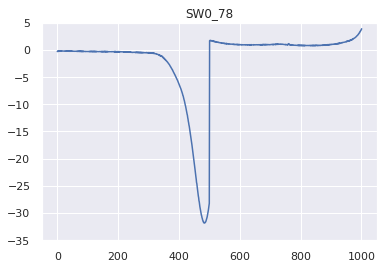

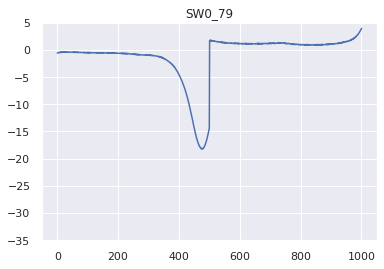

In [6]:
for col in seawater.columns[1:]:
    plt.plot(seawater[col])
    plt.ylim(-35, 5)
    plt.title(col)
    plt.show()

In [18]:
seawater.max().sort_values(ascending=False)

SW0_10     12.251347
SW0_9      11.870250
SW0_65      6.948200
SW0_8       6.197520
SW0_40      5.404087
SW0_0       5.110455
SW0_62      4.900963
SW0_2       4.860555
SW0_3       4.735605
SW0_4       4.735605
SW0_6       4.591912
SW0_57      4.528738
SW0_22      4.528738
SW0_63      4.466700
SW0_26      4.404663
SW0_67      4.342625
SW0_66      4.342625
SW0_16      4.342625
SW0_7       4.335765
SW0_14      4.335765
SW0_1       4.298280
SW0_5       4.267042
SW0_70      4.156513
SW0_15      4.156513
SW0_77      4.156513
SW0_13      4.142092
SW0_18      4.094475
SW0_69      4.094475
SW0_32      4.032438
SW0_21      4.032438
             ...    
SW0_12      3.667282
SW0_31      3.660213
SW0_24      3.660213
SW0_11      3.604807
SW0_23      3.598175
SW0_39      3.598175
SW0_28      3.598175
SW0_33      3.536138
SW0_68      3.536138
SW0_25      3.474100
SW0_56      3.474100
SW0_42      3.474100
SW0_27      3.412063
SW0_54      3.350025
SW0_19      3.225950
SW0_49      3.101875
SW0_59      3

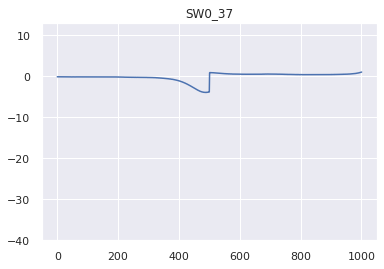

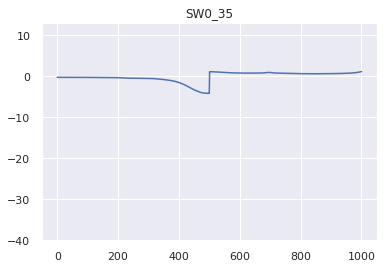

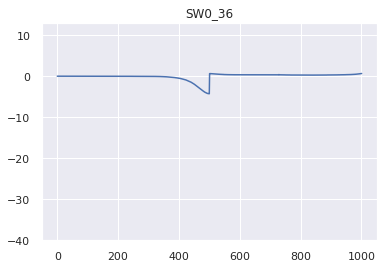

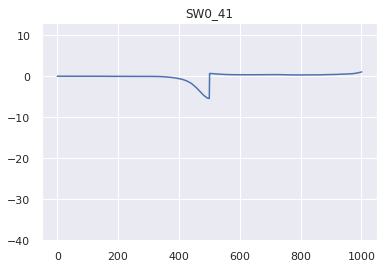

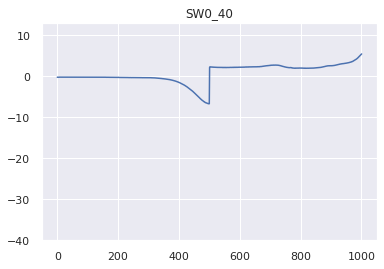

...

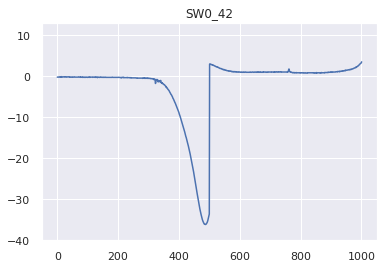

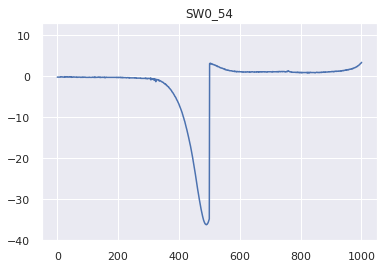

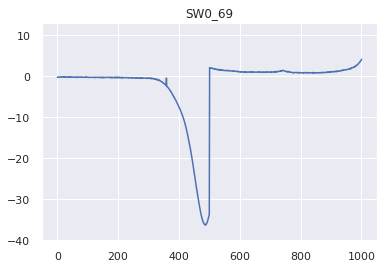

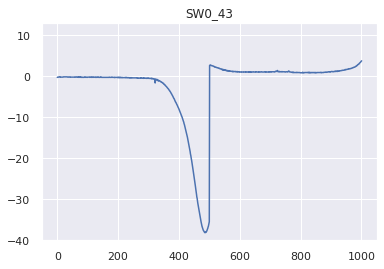

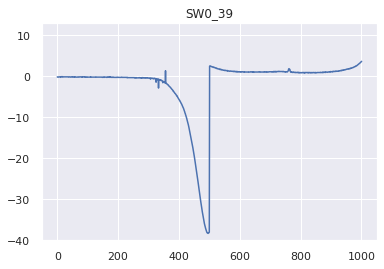

In [19]:
sw_cols_smallest_trough_first = seawater.min().sort_values(ascending=False).index[1:]
for col in seawater[sw_cols_smallest_trough_first]:
    plt.plot(seawater[col])
    plt.ylim(-40, 13)
    plt.title(col)
    plt.show()

In [23]:
sw_sorted_by_min = seawater.min().sort_values(ascending=False)
(sw_sorted_by_min < -30).sum()

40

In [29]:
min_val_less_than_30_cols = sw_sorted_by_min[sw_sorted_by_min < -30].index

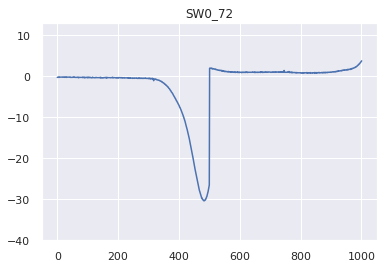

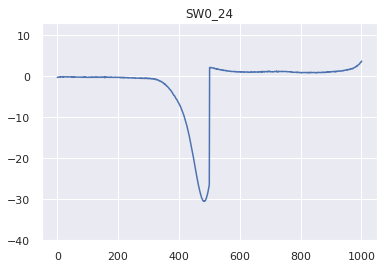

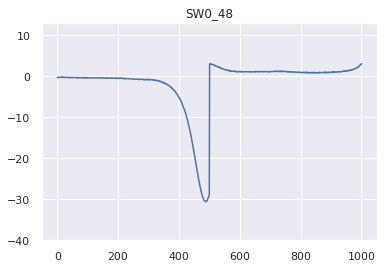

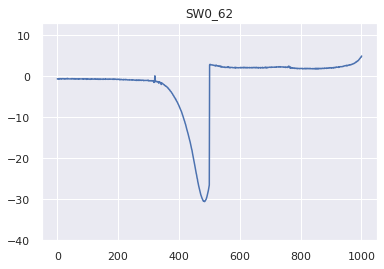

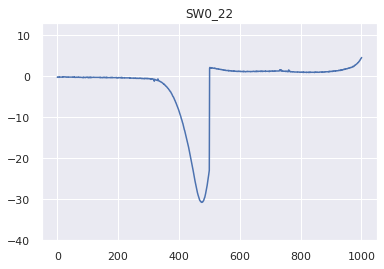

...

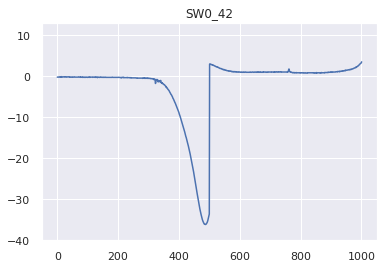

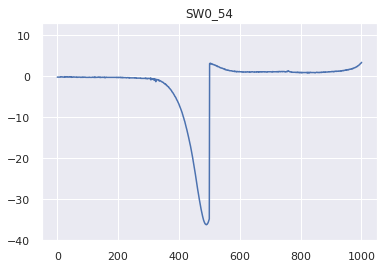

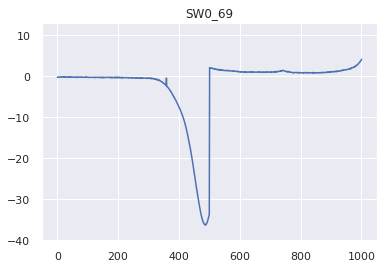

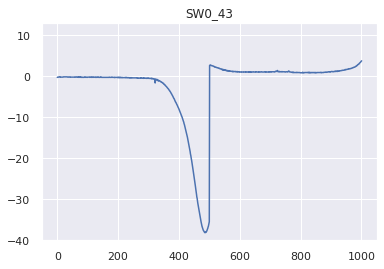

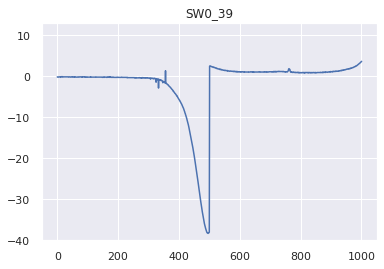

In [31]:
for col in seawater[min_val_less_than_30_cols]:
    plt.plot(seawater[col])
    plt.ylim(-40, 13)
    plt.title(col)
    plt.show()

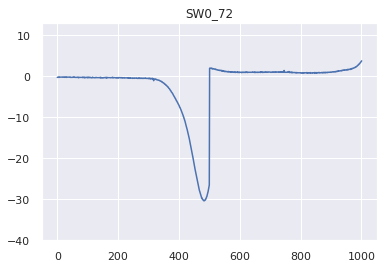

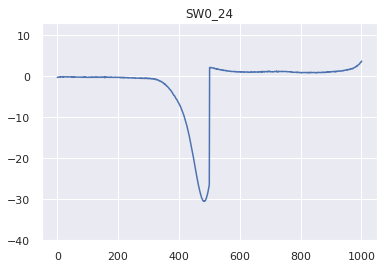

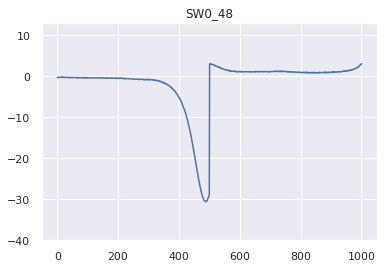

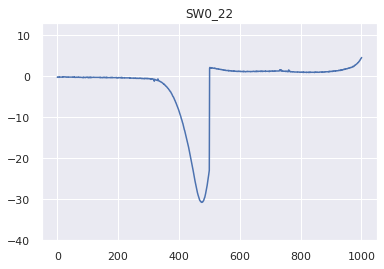

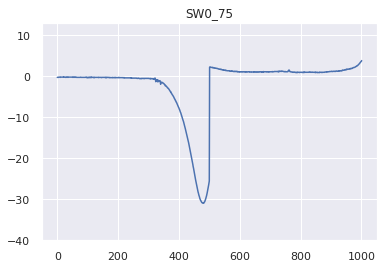

...

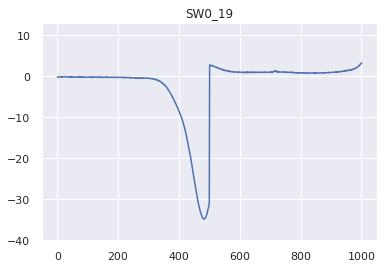

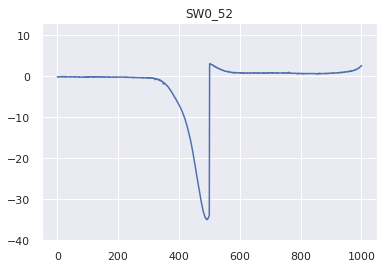

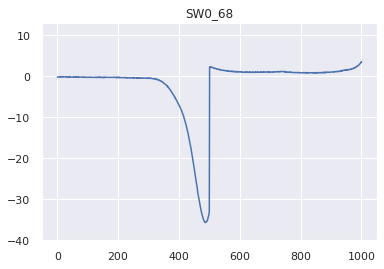

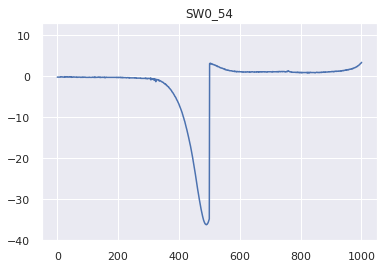

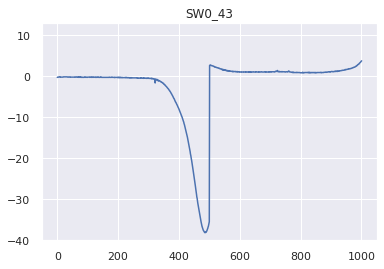

In [33]:
bad_cols = [62, 5, 1, 17, 76, 11, 38, 42, 69, 39]
bad_cols = [f'SW0_{n}' for n in bad_cols]
for col in seawater[min_val_less_than_30_cols].drop(bad_cols, axis=1):
    plt.plot(seawater[col])
    plt.ylim(-40, 13)
    plt.title(col)
    plt.show()

In [39]:
best_sw = seawater[min_val_less_than_30_cols].drop(bad_cols, axis=1)
best_sw_cols_less_than_30_min_val = best_sw.columns
print(len(best_sw_cols_less_than_30_min_val))
best_sw_cols_less_than_30_min_val

30


Index(['SW0_72', 'SW0_24', 'SW0_48', 'SW0_22', 'SW0_75', 'SW0_25', 'SW0_47',
       'SW0_58', 'SW0_27', 'SW0_78', 'SW0_21', 'SW0_74', 'SW0_31', 'SW0_63',
       'SW0_29', 'SW0_15', 'SW0_44', 'SW0_33', 'SW0_46', 'SW0_45', 'SW0_60',
       'SW0_20', 'SW0_77', 'SW0_64', 'SW0_71', 'SW0_19', 'SW0_52', 'SW0_68',
       'SW0_54', 'SW0_43'],
      dtype='object')